# DermNet Skin Condition Diagnosis
# Vision Transformer (ViT-B/16) — Training, Evaluation & Attention Rollout Auditing

**Platform:** Kaggle (P100 GPU)  
**Framework:** PyTorch + timm

| Section | Content |
|---|---|
| 1 | Environment, installs, GPU check |
| 2 | Configuration block |
| 3 | Architectural discussion — why ViT-B/16, how it fundamentally differs from CNN-based models |
| 4 | Class discovery & label encoding |
| 5 | Image manifests & stratified K-fold splits |
| 6 | Class weights for Focal Loss |
| 7 | Augmentation pipelines (ViT-specific considerations) |
| 8 | Dataset & DataLoader classes |
| 9 | Augmented batch sanity check |
| 10 | Model build — ViT-B/16 |
| 11 | Focal Loss implementation |
| 12 | Optimiser & LR schedule (ViT requires special care) |
| 13 | Training loop (two-phase fine-tuning) |
| 14 | Training curves |
| 15 | Test set inference |
| 16 | Classification report (per-class F1/P/R) |
| 17 | Top-K accuracy |
| 18 | Confusion matrices |
| 19 | Per-class accuracy analysis |
| 20 | Best & worst performing classes |
| 21 | Confidence & calibration analysis |
| 22 | Top confused class pairs |
| 23 | Attention Rollout setup — ViT interpretability |
| 24 | Correct predictions audit |
| 25 | High-confidence errors audit |
| 26 | Per-class Attention Rollout gallery |
| 27 | Centre coverage score |
| 28 | Final summary |

---
## Section 1 · Environment Check & Installs

In [1]:
import subprocess, sys

def install(pkg):
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', pkg])

install('timm>=0.9.0')
install('torchmetrics')
install('grad-cam')    # provides GradCAM utilities; we also implement Attention Rollout manually

import torch, torchvision, timm
print(f'PyTorch     : {torch.__version__}')
print(f'Torchvision : {torchvision.__version__}')
print(f'timm        : {timm.__version__}')
print(f'CUDA        : {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'GPU         : {torch.cuda.get_device_name(0)}')
    print(f'VRAM        : {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB')

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'\nUsing: {DEVICE}')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 48.4 MB/s eta 0:00:00
PyTorch     : 2.9.0+cu126
Torchvision : 0.24.0+cu126
timm        : 1.0.24
CUDA        : True
GPU         : Tesla P100-PCIE-16GB
VRAM        : 17.1 GB

Using: cuda


---
## Section 2 · Configuration
*All hyperparameters and paths in one place. Edit only this cell.*

In [2]:
import os, random, warnings
import numpy as np
warnings.filterwarnings('ignore')

# ── Paths ──────────────────────────────────────────────────────────────────────
BASE_DIR   = '/kaggle/input/datasets/joshuaaryampa/skin-conditions/dermnet'
TRAIN_DIR  = os.path.join(BASE_DIR, 'train')
TEST_DIR   = os.path.join(BASE_DIR, 'test')
OUTPUT_DIR = '/kaggle/working/vit_outputs'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# ── Model ──────────────────────────────────────────────────────────────────────
# vit_base_patch16_224: ViT-Base with 16×16 patches, pretrained at 224×224.
# The patch size directly determines the token sequence length:
#   224×224 image / 16×16 patch = 196 image patches + 1 [CLS] token = 197 tokens.
# Using a larger input (e.g. 384) would increase sequence to 576+1 tokens,
# quadrupling attention computation (O(n²)). We use 224 for GPU budget.
MODEL_NAME  = 'vit_base_patch16_224'
IMG_SIZE    = 224
PATCH_SIZE  = 16
NUM_WORKERS = 2

# ── Training ───────────────────────────────────────────────────────────────────
# ViT-B/16 has ~86M parameters. VRAM usage is dominated by attention maps
# (197×197 per head × 12 heads × 12 layers per sample). Use batch size 16
# for safe VRAM headroom on a 16GB P100.
BATCH_SIZE          = 16
NUM_EPOCHS          = 30
WARMUP_EPOCHS       = 5       # Phase 1: head-only (frozen backbone)
N_FOLDS             = 5
FOLD_TO_TRAIN       = 0       # Change 0-4 to train other folds
SEED                = 42
# ViT requires a LOWER peak LR than all CNN-based models.
# Transformers are highly sensitive to large LR — the attention weight matrices
# destabilise rapidly under large gradients, especially when fine-tuning from
# ImageNet-21k weights to a domain-specific dataset.
LR_MAX              = 1e-4
WEIGHT_DECAY        = 1e-4
FOCAL_GAMMA         = 2.0
LABEL_SMOOTHING     = 0.1
EARLY_STOP_PATIENCE = 7

# ── Normalisation ──────────────────────────────────────────────────────────────
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

def seed_everything(seed):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False

seed_everything(SEED)
print('Configuration loaded.')
print(f'  Model={MODEL_NAME}  Input={IMG_SIZE}px  Patch={PATCH_SIZE}px  Batch={BATCH_SIZE}  Epochs={NUM_EPOCHS}  Fold={FOLD_TO_TRAIN}')
print(f'  Sequence length: {(IMG_SIZE//PATCH_SIZE)**2 + 1} tokens (196 patches + 1 CLS)')

Configuration loaded.
  Model=vit_base_patch16_224  Input=224px  Patch=16px  Batch=16  Epochs=30  Fold=0
  Sequence length: 197 tokens (196 patches + 1 CLS)


---
## Section 3 · Architectural Discussion: Vision Transformer (ViT-B/16)

### 3.1 Origins and the Paradigm Shift
Vision Transformer (Dosovitskiy et al., *An Image is Worth 16×16 Words*, ICLR 2021) broke with 30 years of convolutional network design by asking: what if we applied a pure Transformer — unchanged from NLP — to images? The answer required one key adaptation: splitting the image into fixed-size non-overlapping patches and treating each patch as a "word" (token) in a sequence.

ViT-B/16 is the Base tier of the ViT family. B = Base (12 transformer layers, 768-dimensional embedding, 12 attention heads per layer). 16 = 16×16 patch size. This is the most widely pretrained ViT variant and the practical starting point for fine-tuning.

### 3.2 How ViT Fundamentally Differs from All Three CNN-based Models

This is not a minor architectural variation — ViT represents a complete change of inductive biases:

| Property | EfficientNetV2-S | ConvNeXt-Base | DenseNet-121 | ViT-B/16 |
|---|---|---|---|---|
| **Parameters** | ~22M | ~89M | ~8M | ~86M |
| **Core operation** | 2D convolution (local) | 2D convolution (local, 7×7) | 2D convolution (local) | Self-attention (global) |
| **Receptive field** | Local → expands with depth | Local → expands with depth | Local → expands with depth | **Global from layer 1** |
| **Spatial inductive bias** | Strong (translation equivariance) | Strong | Strong | **None — must learn from data** |
| **Input tokenisation** | Pixel-level, hierarchical | Pixel-level, hierarchical | Pixel-level, hierarchical | **16×16 patch tokens** |
| **Sequence processing** | None | None | None | **Multi-head self-attention** |
| **Position encoding** | Implicit (conv stride) | Implicit (conv stride) | Implicit (conv stride) | **Explicit learnable 1D positional embeddings** |
| **Scale sensitivity** | Hierarchical (multi-scale) | Hierarchical (multi-scale) | Hierarchical (multi-scale) | **Flat (single scale, 16px patches)** |
| **Data requirements** | Moderate (pretrained) | Moderate (pretrained) | Low (pretrained) | **High — ViT trained on ImageNet-21k (14M images)** |

### 3.3 The Patch Embedding: How Images Become Sequences
For a 224×224 input with 16×16 patches:
1. The image is divided into 14×14 = 196 non-overlapping 16×16 patches
2. Each patch is flattened to a 16×16×3 = 768-dimensional vector
3. A learned linear projection maps each 768-dim vector to a 768-dim token embedding
4. A learned positional embedding (1D, positions 0–196) is added to each token
5. A special learnable `[CLS]` token is prepended (position 0) — this token's final representation is used for classification
6. The sequence of 197 tokens is passed through 12 transformer layers

**There are no convolutions after the patch embedding.** The patch embedding itself is implemented as a single 16×16 convolution with stride 16 — but its purpose is tokenisation, not feature extraction.

### 3.4 Why Global Attention Matters for Skin Condition Diagnosis

**Critical clinical implication:** CNNs build receptive fields hierarchically. A 3×3 convolution at layer 1 sees a 3×3 region; the same spatial region at layer 12 has seen ~100×100 pixels through accumulated strides and dilations. In the early layers, the model cannot "see" the full lesion at once.

ViT's self-attention is global from layer 1. Every patch can attend to every other patch simultaneously in the first transformer block. For dermatology:

- **Bilaterally symmetric lesions** (e.g., lichen planus, psoriasis): ViT can directly compare corresponding patches on opposite sides of the lesion from layer 1, while CNNs must wait until the receptive field has grown enough to encompass both sides.
- **Lesion border definition**: Border regularity (ABCDE criterion) requires comparing patches at the lesion centre with patches at the periphery. ViT's global attention does this explicitly.
- **Satellite lesions**: Secondary lesions far from the primary lesion (e.g., in secondary syphilis, pityriasis rosea) are spatially distant. Global attention makes inter-lesion relationships directly computable; CNNs must propagate this over many layers.
- **Background context**: Acquisition artefacts (hair, rulers, colour calibration cards — EDA VIZ 13–14) are spatially peripheral. ViT's global attention could learn to suppress these globally rather than learning local suppression patterns as CNNs do.

### 3.5 EDA Findings vs ViT Properties

| EDA Finding | ViT-B/16 Property | Implication |
|---|---|---|
| Colour is discriminative (VIZ 15–17) | Patch embeddings are colour-sensitive; attention can compare colour across the entire image | Redness patterns, saturation gradients captured globally |
| Texture is discriminative (VIZ 19) | 16×16 patches capture local texture; attention propagates texture context globally | Scale-level texture patterns accessible, but fine sub-pixel texture may be under-represented vs CNNs |
| Image size variability (VIZ 9–11) | Fixed 224×224 input; interpolation of positional embeddings required if size changes | Pad-to-square then resize; positional embeddings adapt during fine-tuning |
| Class imbalance (VIZ 1–5) | Compatible with Focal Loss + WeightedRandomSampler | Standard imbalance handling applies |
| Acquisition variability (VIZ 13–14) | LayerNorm in every transformer block; no BatchNorm | Robust to batch-level brightness variation, same as ConvNeXt |
| Small dataset per class | ViT requires large data — mitigated by ImageNet-21k pretraining | Sufficient for fine-tuning with the techniques used here; monitor for overfitting |
| Non-RGB images (VIZ 12) | Patch embedding is 3-channel | Enforce img.convert('RGB') as for all models |

### 3.6 ViT-B/16 Architecture: Transformer Encoder Detail

| Component | Specification |
|---|---|
| Patch size | 16×16 pixels |
| Embedding dimension (D) | 768 |
| Transformer layers | 12 |
| Attention heads per layer | 12 |
| Head dimension | 64 (= 768 / 12) |
| MLP hidden dimension | 3072 (= 4 × 768) |
| Sequence length | 197 (196 patches + 1 CLS) |
| Attention computation | O(197² × 12 heads × 12 layers) per sample |
| Classification head | Linear(768 → N) on CLS token |
| Normalisation | LayerNorm (pre-norm architecture) |
| Activation (MLP) | GELU |
| Position encoding | Learnable 1D embeddings, interpolated at different resolutions |

### 3.7 Interpretability: Attention Rollout vs Grad-CAM
**ViT cannot be audited with standard Grad-CAM.** Grad-CAM requires spatial feature maps with meaningful 2D structure — it computes gradients with respect to a convolutional feature map and weights each spatial position. In ViT, there are no intermediate 2D feature maps; the transformer processes a 1D sequence of 197 tokens.

Instead, we implement **Attention Rollout** (Abnar & Zuidema, 2020), which:
1. Extracts the 12×12 attention weight matrices from all 12 transformer layers
2. Accounts for residual connections (identity matrix added to each attention map: A_hat = 0.5×A + 0.5×I)
3. Multiplies (rolls out) the adjusted attention maps across all layers: Rollout = A_hat_1 × A_hat_2 × ... × A_hat_12
4. Extracts the [CLS] token's attention to all 196 patch tokens from the resulting matrix
5. Reshapes the 196-value vector into a 14×14 spatial map and upsamples to 224×224

Attention Rollout gives a spatially interpretable map of which image regions most influenced the [CLS] token's final representation — and therefore the classification decision.

### 3.8 Two-Phase Fine-Tuning Strategy
ViT requires **more conservative fine-tuning** than CNN-based models:
- **Phase 1 (Epochs 1–5):** Backbone frozen. Only the classification head trains at LR_MAX=1e-4. This warms up the new head without touching the attention weight matrices — which are highly sensitive to large gradient updates from an untrained head.
- **Phase 2 (Epochs 6–30):** All layers unfrozen. Backbone at LR_MAX/10 = 1e-5, head at LR_MAX = 1e-4. OneCycleLR cosine annealing. The extremely low backbone LR (1e-5) is deliberate — the attention matrices have been pretrained to encode spatial relationships over ImageNet-21k; aggressive fine-tuning at higher LR destroys these learned relationships and causes catastrophic forgetting.

---
## Section 4 · Class Discovery & Label Encoding

In [3]:
from pathlib import Path
import pandas as pd

classes = sorted([
    d for d in os.listdir(TRAIN_DIR)
    if os.path.isdir(os.path.join(TRAIN_DIR, d))
])
NUM_CLASSES  = len(classes)
class_to_idx = {c: i for i, c in enumerate(classes)}
idx_to_class = {i: c for c, i in class_to_idx.items()}

print(f'Total classes (model output nodes): {NUM_CLASSES}')
for i, c in enumerate(classes, 1):
    print(f'  {i:>2}. {c}')

Total classes (model output nodes): 23
   1. Acne and Rosacea Photos
   2. Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions
   3. Atopic Dermatitis Photos
   4. Bullous Disease Photos
   5. Cellulitis Impetigo and other Bacterial Infections
   6. Eczema Photos
   7. Exanthems and Drug Eruptions
   8. Hair Loss Photos Alopecia and other Hair Diseases
   9. Herpes HPV and other STDs Photos
  10. Light Diseases and Disorders of Pigmentation
  11. Lupus and other Connective Tissue diseases
  12. Melanoma Skin Cancer Nevi and Moles
  13. Nail Fungus and other Nail Disease
  14. Poison Ivy Photos and other Contact Dermatitis
  15. Psoriasis pictures Lichen Planus and related diseases
  16. Scabies Lyme Disease and other Infestations and Bites
  17. Seborrheic Keratoses and other Benign Tumors
  18. Systemic Disease
  19. Tinea Ringworm Candidiasis and other Fungal Infections
  20. Urticaria Hives
  21. Vascular Tumors
  22. Vasculitis Photos
  23. Warts Molluscum and other 

---
## Section 5 · Image Manifests & Stratified K-Fold Splits

In [4]:
from sklearn.model_selection import StratifiedKFold

VALID_EXTS = {'.png', '.jpg', '.jpeg', '.bmp', '.tiff'}

def build_manifest(root, class_to_idx):
    rows = []
    for cls, idx in class_to_idx.items():
        folder = os.path.join(root, cls)
        if not os.path.isdir(folder): continue
        for fname in os.listdir(folder):
            if Path(fname).suffix.lower() in VALID_EXTS:
                rows.append({'path': os.path.join(folder, fname), 'label': idx, 'class': cls})
    return pd.DataFrame(rows).sample(frac=1, random_state=SEED).reset_index(drop=True)

train_df = build_manifest(TRAIN_DIR, class_to_idx)
test_df  = build_manifest(TEST_DIR,  class_to_idx)

# Stratified K-Fold — required by EDA thin test coverage finding (VIZ 7-8)
skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
train_df['fold'] = -1
for fold, (_, val_idx) in enumerate(skf.split(train_df, train_df['label'])):
    train_df.loc[val_idx, 'fold'] = fold

print(f'Train: {len(train_df):,} images  |  Test: {len(test_df):,} images')
for f in range(N_FOLDS):
    print(f'  Fold {f}: train={(train_df["fold"]!=f).sum():,}  val={(train_df["fold"]==f).sum():,}')

Train: 14,894 images  |  Test: 3,409 images
  Fold 0: train=11,915  val=2,979
  Fold 1: train=11,915  val=2,979
  Fold 2: train=11,915  val=2,979
  Fold 3: train=11,915  val=2,979
  Fold 4: train=11,916  val=2,978


---
## Section 6 · Class Weights for Focal Loss
*Inverse frequency weighting — directly addresses imbalance finding from EDA VIZ 1–5.*

In [5]:
from collections import Counter

label_counts  = Counter(train_df['label'].tolist())
total_images  = sum(label_counts.values())
class_weights = torch.tensor([
    total_images / (NUM_CLASSES * label_counts[i])
    for i in range(NUM_CLASSES)
], dtype=torch.float32).to(DEVICE)

print('Class weights (higher = more minority):')
for i, c in enumerate(classes):
    print(f'  {c:<45} {class_weights[i].item():.4f}')

Class weights (higher = more minority):
  Acne and Rosacea Photos                       0.7897
  Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions 0.5772
  Atopic Dermatitis Photos                      1.3407
  Bullous Disease Photos                        1.4785
  Cellulitis Impetigo and other Bacterial Infections 2.2963
  Eczema Photos                                 0.5573
  Exanthems and Drug Eruptions                  1.7177
  Hair Loss Photos Alopecia and other Hair Diseases 2.7912
  Herpes HPV and other STDs Photos              1.6069
  Light Diseases and Disorders of Pigmentation  1.1795
  Lupus and other Connective Tissue diseases    1.5566
  Melanoma Skin Cancer Nevi and Moles           1.4422
  Nail Fungus and other Nail Disease            0.6774
  Poison Ivy Photos and other Contact Dermatitis 2.5495
  Psoriasis pictures Lichen Planus and related diseases 0.5043
  Scabies Lyme Disease and other Infestations and Bites 1.5418
  Seborrheic Keratoses and other 

---
## Section 7 · Augmentation Pipelines

**ViT-specific augmentation considerations:**

ViT was originally trained with strong augmentation: Mixup, CutMix, RandAugment, and Random Erasing. However, for this medical dataset we make the same decision as with ConvNeXt-Base:
- **No Mixup or CutMix:** Blending two different skin conditions creates physiologically impossible composites that would confuse clinical colour and texture signals.
- **No Random Erasing:** In a 14×14 token grid, erasing patches removes entire 16×16 blocks of the input — a coarser spatial destruction than pixel-level erasing. On a medical image, this could remove the diagnostically critical lesion centre.
- **Conservative colour jitter (same as all other models):** EDA VIZ 15–17 established colour as a primary discriminative signal.

**Patch alignment note:** ViT divides the image into 16×16 patches starting from the top-left corner. `RandomCrop` with a size not divisible by 16 would misalign patches with the positional embeddings. We use `Resize` rather than `RandomCrop` to ensure patch boundaries remain consistent with the model's learned positional structure.

In [6]:
import torchvision.transforms as T
import torchvision.transforms.functional as TF
from PIL import Image

class PadToSquare:
    """Pad to square with black border — preserves lesion aspect ratio (EDA VIZ 10-11).
    
    ViT note: square input ensures all 14×14 = 196 patch positions are used uniformly.
    Non-square inputs would under-sample patches in the shorter dimension.
    """
    def __call__(self, img):
        w, h = img.size
        s    = max(w, h)
        pw, ph = (s - w) // 2, (s - h) // 2
        return TF.pad(img, [pw, ph, s - w - pw, s - h - ph], fill=0)

train_transform = T.Compose([
    T.Lambda(lambda img: img.convert('RGB')),   # EDA VIZ 12: enforce RGB
    PadToSquare(),                               # Ensures square → uniform patch grid
    T.Resize((IMG_SIZE, IMG_SIZE)),              # 224×224 → 14×14 patch grid
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.2),
    T.RandomRotation(degrees=15),
    T.ColorJitter(
        brightness=0.15,   # conservative — erythema signal (EDA VIZ 15)
        contrast=0.15,
        saturation=0.10,   # saturation is class-discriminative (EDA VIZ 17)
        hue=0.05,          # minimal — hue shifts destroy clinical colour
    ),
    # Translate only — no crop (would misalign patch grid)
    T.RandomAffine(degrees=0, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

val_transform = T.Compose([
    T.Lambda(lambda img: img.convert('RGB')),
    PadToSquare(),
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

print('Transforms defined.')
print(f'  Input: {IMG_SIZE}×{IMG_SIZE}  →  {IMG_SIZE//PATCH_SIZE}×{IMG_SIZE//PATCH_SIZE} = {(IMG_SIZE//PATCH_SIZE)**2} patch tokens + 1 CLS = 197 total')

Transforms defined.
  Input: 224×224  →  14×14 = 196 patch tokens + 1 CLS = 197 total


---
## Section 8 · Dataset & DataLoader Classes

In [7]:
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

class SkinDataset(Dataset):
    def __init__(self, df, transform=None, return_path=False):
        self.df          = df.reset_index(drop=True)
        self.transform   = transform
        self.return_path = return_path

    def __len__(self): return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row['path'])
        if self.transform: img = self.transform(img)
        if self.return_path:
            return img, int(row['label']), row['path']
        return img, int(row['label'])


def get_loaders(train_df, fold, batch_size, num_workers):
    fold_train = train_df[train_df['fold'] != fold].reset_index(drop=True)
    fold_val   = train_df[train_df['fold'] == fold].reset_index(drop=True)
    train_ds   = SkinDataset(fold_train, train_transform)
    val_ds     = SkinDataset(fold_val,   val_transform)
    sample_weights = [class_weights[l].item() for l in fold_train['label']]
    sampler    = WeightedRandomSampler(sample_weights, len(fold_train), replacement=True)
    train_loader = DataLoader(train_ds, batch_size=batch_size, sampler=sampler,
                              num_workers=num_workers, pin_memory=True, drop_last=True)
    val_loader   = DataLoader(val_ds, batch_size=batch_size*2, shuffle=False,
                              num_workers=num_workers, pin_memory=True)
    return train_loader, val_loader

print('Dataset and DataLoader classes defined.')

Dataset and DataLoader classes defined.


---
## Section 9 · Augmented Batch Sanity Check
*Visually verify that augmented images remain clinically plausible before training. For ViT, additionally verify images are exactly 224×224 so patch tokenisation produces exactly 196 tokens.*

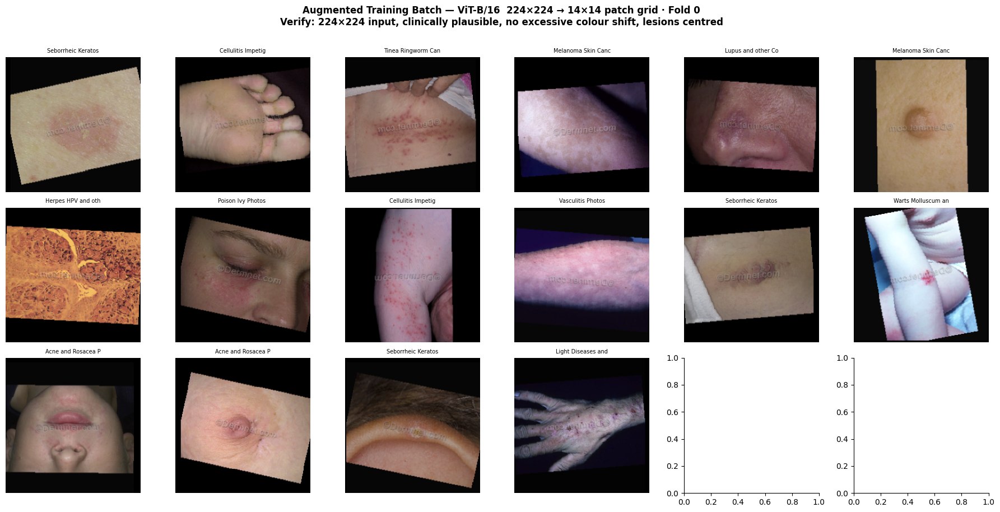

Batch shape : torch.Size([16, 3, 224, 224])  →  H=224, W=224
✓ Input size confirmed: 224×224 → 196 patch tokens
Train batches: 744  |  Val batches: 94


In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams.update({'axes.spines.top': False, 'axes.spines.right': False})

train_loader, val_loader = get_loaders(train_df, FOLD_TO_TRAIN, BATCH_SIZE, NUM_WORKERS)
imgs, labels = next(iter(train_loader))

def denorm(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    std  = torch.tensor(IMAGENET_STD).view(3,1,1)
    return torch.clamp(tensor * std + mean, 0, 1).permute(1,2,0).numpy()

fig, axes = plt.subplots(3, 6, figsize=(18, 9))
for i, ax in enumerate(axes.flat):
    if i >= len(imgs): break
    ax.imshow(denorm(imgs[i]))
    ax.set_title(idx_to_class[labels[i].item()][:18], fontsize=7)
    ax.axis('off')
plt.suptitle(
    f'Augmented Training Batch — ViT-B/16  {IMG_SIZE}×{IMG_SIZE} → 14×14 patch grid · Fold {FOLD_TO_TRAIN}\n'
    'Verify: 224×224 input, clinically plausible, no excessive colour shift, lesions centred',
    fontweight='bold', y=1.01
)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'augmented_batch_preview.png'), dpi=120, bbox_inches='tight')
plt.show()
print(f'Batch shape : {imgs.shape}  →  H={imgs.shape[2]}, W={imgs.shape[3]}')
assert imgs.shape[2] == 224 and imgs.shape[3] == 224, 'Input must be exactly 224×224 for ViT-B/16'
print(f'✓ Input size confirmed: {imgs.shape[2]}×{imgs.shape[3]} → {(imgs.shape[2]//PATCH_SIZE)**2} patch tokens')
print(f'Train batches: {len(train_loader)}  |  Val batches: {len(val_loader)}')

---
## Section 10 · Model Build — ViT-B/16

`vit_base_patch16_224` from timm loads weights pretrained on ImageNet-21k (14 million images, 21,843 classes) and fine-tuned on ImageNet-1k. This two-stage pretraining is essential — ViT requires substantially more data than CNNs to learn useful features from scratch because it has no convolutional inductive biases. The ImageNet-21k pretraining provides the broad visual vocabulary that makes fine-tuning on DermNet feasible with a few thousand images per class.

**Head structure:** ViT's classification head is a single `Linear(768 → NUM_CLASSES)` applied to the [CLS] token's final embedding. We add dropout before this linear layer via `drop_rate=0.3`.

In [9]:
import torch.nn as nn

def build_model(num_classes, pretrained=True):
    """
    ViT-B/16 from timm.
    Architecture: 12 transformer layers, D=768, 12 heads, 14×14 patch grid.
    Head: LayerNorm → Dropout(0.3) → Linear(768 → num_classes) on [CLS] token.
    
    Pretrained on ImageNet-21k (14M images) then fine-tuned on ImageNet-1k.
    The 21k pretraining is essential: ViT has no spatial inductive bias and
    needs large-scale pretraining to learn useful visual representations.
    """
    model = timm.create_model(
        MODEL_NAME,
        pretrained  = pretrained,
        num_classes = num_classes,
        drop_rate   = 0.3,       # classifier dropout (applied to CLS token embedding)
        # Attention dropout — regularise attention weight distributions
        # especially important for fine-tuning on smaller domain-specific datasets
        attn_drop_rate = 0.1,
    )
    return model

model = build_model(NUM_CLASSES).to(DEVICE)

total     = sum(p.numel() for p in model.parameters())
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Model         : {MODEL_NAME}')
print(f'Total params  : {total:,}')
print(f'Trainable     : {trainable:,}')
print(f'\nTransformer architecture:')
print(f'  Embedding dim : {model.embed_dim}')
print(f'  Num layers    : {model.depth if hasattr(model, "depth") else len(model.blocks)}')
print(f'  Num heads     : {model.blocks[0].attn.num_heads}')
print(f'  Patch size    : {model.patch_embed.patch_size}')
print(f'  Num patches   : {model.patch_embed.num_patches}')
print(f'  Sequence len  : {model.patch_embed.num_patches + 1} (patches + CLS)')
print(f'\nClassification head:')
print(model.head)

# Memory estimate — ViT attention is O(n²) in sequence length
if torch.cuda.is_available():
    dummy = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(DEVICE)
    with torch.no_grad(): _ = model(dummy)
    mem = torch.cuda.memory_allocated() / 1e9
    print(f'\nGPU memory (single forward pass): {mem:.2f} GB')
    print(f'  (batch size {BATCH_SIZE} ≈ {mem*BATCH_SIZE:.1f} GB for activation tensors)')
    del dummy; torch.cuda.empty_cache()

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Model         : vit_base_patch16_224
Total params  : 85,816,343
Trainable     : 85,816,343

Transformer architecture:
  Embedding dim : 768
  Num layers    : 12
  Num heads     : 12
  Patch size    : (16, 16)
  Num patches   : 196
  Sequence len  : 197 (patches + CLS)

Classification head:
Linear(in_features=768, out_features=23, bias=True)

GPU memory (single forward pass): 0.35 GB
  (batch size 16 ≈ 5.7 GB for activation tensors)


---
## Section 11 · Focal Loss
*Identical implementation to all three CNN notebooks for comparability. With ViT, Focal Loss interacts with the global attention mechanism: hard minority-class examples that the model struggles to classify receive amplified loss signals that flow back through all 12 attention layers, forcing more discriminative attention patterns for those classes.*

In [10]:
class FocalLoss(nn.Module):
    """
    Focal Loss = -alpha_t * (1 - p_t)^gamma * log(p_t)
    gamma=0  → standard weighted CrossEntropy
    gamma=2  → 4× less weight on well-classified (easy) examples

    ViT note: Focal Loss gradients flow through 12 transformer layers and 12 attention
    heads per layer. Hard examples force the attention mechanism to discover more
    discriminative patch relationships for minority classes.
    """
    def __init__(self, alpha, gamma=2.0, label_smoothing=0.1):
        super().__init__()
        self.alpha           = alpha
        self.gamma           = gamma
        self.label_smoothing = label_smoothing

    def forward(self, logits, targets):
        ce  = nn.functional.cross_entropy(
            logits, targets,
            weight          = self.alpha,
            label_smoothing = self.label_smoothing,
            reduction       = 'none'
        )
        pt  = torch.exp(-ce)
        return (((1 - pt) ** self.gamma) * ce).mean()

criterion = FocalLoss(alpha=class_weights, gamma=FOCAL_GAMMA, label_smoothing=LABEL_SMOOTHING)
print(f'Focal Loss: gamma={FOCAL_GAMMA}, label_smoothing={LABEL_SMOOTHING}')
print(f'Weight range: {class_weights.min().item():.4f} – {class_weights.max().item():.4f}')

Focal Loss: gamma=2.0, label_smoothing=0.1
Weight range: 0.4804 – 3.1133


---
## Section 12 · Optimiser & Learning Rate Schedule
*LR_MAX=1e-4: the lowest peak LR across all four models. ViT's attention matrices are pretrained to encode spatial relationships across ImageNet-21k. Aggressive fine-tuning at higher LR causes catastrophic forgetting of these learned relationships. Backbone LR is 1e-5 — ten times lower — in Phase 2.*

In [11]:
import torch.optim as optim

def freeze_backbone(model):
    """Freeze all layers except the classification head (model.head)."""
    for name, p in model.named_parameters():
        # ViT head in timm is model.head
        if 'head' not in name: p.requires_grad = False
    t = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f'Backbone frozen  — trainable: {t:,} (head only)')

def unfreeze_all(model):
    for p in model.parameters(): p.requires_grad = True
    t = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f'All layers unfrozen — trainable: {t:,}')

def make_optimizer_scheduler(model, phase, steps_per_epoch, n_epochs):
    if phase == 1:
        opt = optim.AdamW(
            filter(lambda p: p.requires_grad, model.parameters()),
            lr=LR_MAX, weight_decay=WEIGHT_DECAY
        )
        sch = optim.lr_scheduler.OneCycleLR(
            opt, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch,
            epochs=n_epochs, pct_start=0.3, anneal_strategy='cos'
        )
    else:
        head_p     = [p for n, p in model.named_parameters() if 'head' in n]
        backbone_p = [p for n, p in model.named_parameters() if 'head' not in n]
        opt = optim.AdamW([
            {'params': backbone_p, 'lr': LR_MAX / 10},   # 1e-5 — very conservative for attention layers
            {'params': head_p,     'lr': LR_MAX},         # 1e-4
        ], weight_decay=WEIGHT_DECAY)
        sch = optim.lr_scheduler.OneCycleLR(
            opt, max_lr=[LR_MAX / 10, LR_MAX],
            steps_per_epoch=steps_per_epoch,
            epochs=n_epochs, pct_start=0.2, anneal_strategy='cos'
        )
    return opt, sch

print('Optimiser and scheduler functions defined.')
print(f'Peak LR Phase 1: {LR_MAX}  (head only)')
print(f'Peak LR Phase 2: backbone={LR_MAX/10}  head={LR_MAX}')
print(f'  (ViT backbone LR is {LR_MAX/10:.0e} — lowest of all four models)')

Optimiser and scheduler functions defined.
Peak LR Phase 1: 0.0001  (head only)
Peak LR Phase 2: backbone=1e-05  head=0.0001
  (ViT backbone LR is 1e-05 — lowest of all four models)


---
## Section 13 · Training Loop (Two-Phase Fine-Tuning)

In [12]:
import time
from torch.cuda.amp import GradScaler, autocast

scaler = GradScaler()

def train_epoch(model, loader, optimizer, scheduler, criterion, epoch):
    model.train()
    loss_sum = correct = total = 0
    t0 = time.time()
    for i, (imgs, labels) in enumerate(loader):
        imgs, labels = imgs.to(DEVICE, non_blocking=True), labels.to(DEVICE, non_blocking=True)
        optimizer.zero_grad(set_to_none=True)
        with autocast():
            logits = model(imgs)
            loss   = criterion(logits, labels)
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        # Gradient clipping is especially important for ViT — attention weight
        # gradients can be large and destabilise training if not clipped
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(optimizer); scaler.update()
        scheduler.step()
        loss_sum += loss.item() * imgs.size(0)
        correct  += (logits.argmax(1) == labels).sum().item()
        total    += imgs.size(0)
        if (i + 1) % 50 == 0:
            print(f'  [{epoch}|{i+1}/{len(loader)}] loss={loss_sum/total:.4f} '
                  f'acc={correct/total:.4f} lr={scheduler.get_last_lr()[0]:.2e}')
    return loss_sum / total, correct / total, time.time() - t0

@torch.no_grad()
def validate(model, loader, criterion):
    model.eval()
    loss_sum = correct = total = 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE, non_blocking=True), labels.to(DEVICE, non_blocking=True)
        with autocast():
            logits = model(imgs)
            loss   = criterion(logits, labels)
        loss_sum += loss.item() * imgs.size(0)
        correct  += (logits.argmax(1) == labels).sum().item()
        total    += imgs.size(0)
    return loss_sum / total, correct / total

# ── Training state ─────────────────────────────────────────────────────────────
history   = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [], 'lr': []}
best_acc  = 0.0
patience  = 0
best_ckpt = os.path.join(OUTPUT_DIR, f'best_vit_fold{FOLD_TO_TRAIN}.pth')

# ── PHASE 1: Head warmup ───────────────────────────────────────────────────────
print('=' * 60)
print(f'PHASE 1 — Head Warmup (Epochs 1–{WARMUP_EPOCHS}, backbone frozen)')
print('  ViT note: head warmup is CRITICAL — randomly initialised head')
print('  produces gradients that flow through ALL 12 attention layers.')
print('  Frozen backbone prevents corruption of pretrained attention patterns.')
print('=' * 60)
freeze_backbone(model)
opt, sch = make_optimizer_scheduler(model, 1, len(train_loader), WARMUP_EPOCHS)

for epoch in range(1, WARMUP_EPOCHS + 1):
    tl, ta, dt = train_epoch(model, train_loader, opt, sch, criterion, epoch)
    vl, va     = validate(model, val_loader, criterion)
    history['train_loss'].append(tl); history['val_loss'].append(vl)
    history['train_acc'].append(ta);  history['val_acc'].append(va)
    history['lr'].append(sch.get_last_lr()[0])
    print(f'Epoch {epoch:>3}/{NUM_EPOCHS} | TrL={tl:.4f} TrA={ta:.4f} | VlL={vl:.4f} VlA={va:.4f} | {dt:.0f}s')

# ── PHASE 2: Full fine-tuning ──────────────────────────────────────────────────
print('\n' + '=' * 60)
print(f'PHASE 2 — Full Fine-tuning (Epochs {WARMUP_EPOCHS+1}–{NUM_EPOCHS})')
print(f'  Backbone LR: {LR_MAX/10:.0e}  Head LR: {LR_MAX:.0e}')
print('=' * 60)
unfreeze_all(model)
phase2_epochs = NUM_EPOCHS - WARMUP_EPOCHS
opt, sch = make_optimizer_scheduler(model, 2, len(train_loader), phase2_epochs)

for epoch in range(WARMUP_EPOCHS + 1, NUM_EPOCHS + 1):
    tl, ta, dt = train_epoch(model, train_loader, opt, sch, criterion, epoch)
    vl, va     = validate(model, val_loader, criterion)
    history['train_loss'].append(tl); history['val_loss'].append(vl)
    history['train_acc'].append(ta);  history['val_acc'].append(va)
    history['lr'].append(sch.get_last_lr()[0])
    print(f'Epoch {epoch:>3}/{NUM_EPOCHS} | TrL={tl:.4f} TrA={ta:.4f} | VlL={vl:.4f} VlA={va:.4f} | {dt:.0f}s', end='')
    if va > best_acc:
        best_acc = va; patience = 0
        torch.save({
            'epoch': epoch, 'model_state': model.state_dict(),
            'val_acc': va, 'val_loss': vl,
            'history': history, 'classes': classes, 'NUM_CLASSES': NUM_CLASSES
        }, best_ckpt)
        print(f'  ✓ checkpoint saved (val_acc={va:.4f})')
    else:
        patience += 1
        print(f'  (patience {patience}/{EARLY_STOP_PATIENCE})')
    if patience >= EARLY_STOP_PATIENCE:
        print(f'Early stopping at epoch {epoch}.'); break

print(f'\nTraining complete. Best val accuracy: {best_acc:.4f}')

PHASE 1 — Head Warmup (Epochs 1–5, backbone frozen)
  ViT note: head warmup is CRITICAL — randomly initialised head
  produces gradients that flow through ALL 12 attention layers.
  Frozen backbone prevents corruption of pretrained attention patterns.
Backbone frozen  — trainable: 17,687 (head only)
  [1|50/744] loss=4.7991 acc=0.0500 lr=4.48e-06
  [1|100/744] loss=4.7776 acc=0.0456 lr=5.89e-06
  [1|150/744] loss=4.7917 acc=0.0471 lr=8.22e-06
  [1|200/744] loss=4.7704 acc=0.0416 lr=1.14e-05
  [1|250/744] loss=4.7331 acc=0.0428 lr=1.54e-05
  [1|300/744] loss=4.6651 acc=0.0462 lr=2.02e-05
  [1|350/744] loss=4.6145 acc=0.0482 lr=2.55e-05
  [1|400/744] loss=4.5776 acc=0.0491 lr=3.14e-05
  [1|450/744] loss=4.5433 acc=0.0515 lr=3.77e-05
  [1|500/744] loss=4.5022 acc=0.0529 lr=4.43e-05
  [1|550/744] loss=4.4660 acc=0.0557 lr=5.10e-05
  [1|600/744] loss=4.4328 acc=0.0574 lr=5.77e-05
  [1|650/744] loss=4.4012 acc=0.0598 lr=6.44e-05
  [1|700/744] loss=4.3659 acc=0.0607 lr=7.08e-05
Epoch   1/30 |

---
## Section 14 · Training Curves

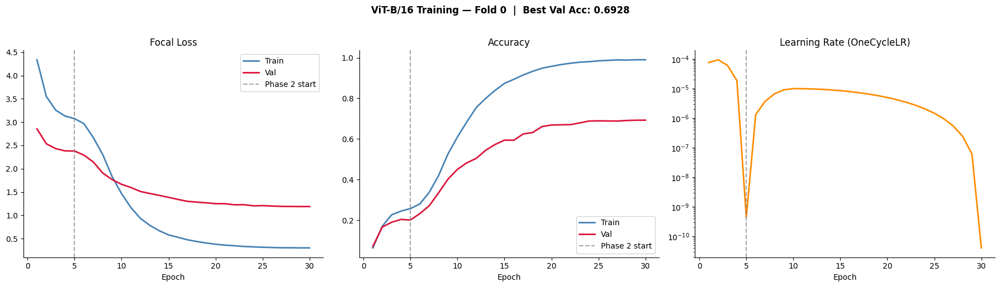

In [13]:
ep = range(1, len(history['train_loss']) + 1)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(ep, history['train_loss'], color='steelblue', lw=2, label='Train')
axes[0].plot(ep, history['val_loss'],   color='crimson',   lw=2, label='Val')
axes[0].axvline(WARMUP_EPOCHS, color='grey', ls='--', alpha=0.7, label='Phase 2 start')
axes[0].set_title('Focal Loss'); axes[0].set_xlabel('Epoch'); axes[0].legend()

axes[1].plot(ep, history['train_acc'], color='steelblue', lw=2, label='Train')
axes[1].plot(ep, history['val_acc'],   color='crimson',   lw=2, label='Val')
axes[1].axvline(WARMUP_EPOCHS, color='grey', ls='--', alpha=0.7, label='Phase 2 start')
axes[1].set_title('Accuracy'); axes[1].set_xlabel('Epoch'); axes[1].legend()

axes[2].plot(ep, history['lr'], color='darkorange', lw=2)
axes[2].axvline(WARMUP_EPOCHS, color='grey', ls='--', alpha=0.7)
axes[2].set_title('Learning Rate (OneCycleLR)')
axes[2].set_xlabel('Epoch'); axes[2].set_yscale('log')

plt.suptitle(f'ViT-B/16 Training — Fold {FOLD_TO_TRAIN}  |  Best Val Acc: {best_acc:.4f}',
             fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, f'training_curves_fold{FOLD_TO_TRAIN}.png'), dpi=120, bbox_inches='tight')
plt.show()

---
## Section 15 · Load Best Checkpoint & Test Set Inference

In [14]:
import torch.nn.functional as F

checkpoint = torch.load(best_ckpt, map_location=DEVICE)
model.load_state_dict(checkpoint['model_state'])
model.eval()
print(f'Best checkpoint loaded — epoch {checkpoint["epoch"]}  val_acc={checkpoint["val_acc"]:.4f}')

# Build test loader with path return for Attention Rollout later
test_ds_paths     = SkinDataset(test_df, val_transform, return_path=True)
test_loader_paths = DataLoader(test_ds_paths, batch_size=BATCH_SIZE*2, shuffle=False,
                                num_workers=NUM_WORKERS, pin_memory=True)

all_preds, all_labels, all_probs, all_paths = [], [], [], []

with torch.no_grad():
    for imgs, labels, paths in test_loader_paths:
        imgs = imgs.to(DEVICE, non_blocking=True)
        with autocast():
            logits = model(imgs)
        probs = F.softmax(logits, dim=1).cpu().numpy()
        all_probs.extend(probs)
        all_preds.extend(probs.argmax(axis=1))
        all_labels.extend(labels.numpy())
        all_paths.extend(paths)

all_preds     = np.array(all_preds)
all_labels    = np.array(all_labels)
all_probs     = np.array(all_probs)
all_probs_max = all_probs.max(axis=1)
correct_mask  = (all_preds == all_labels)
overall_acc   = correct_mask.mean()

print(f'Test images      : {len(all_labels):,}')
print(f'Overall accuracy : {overall_acc:.4f}  ({overall_acc*100:.2f}%)')

Best checkpoint loaded — epoch 30  val_acc=0.6928
Test images      : 3,409
Overall accuracy : 0.6800  (68.00%)


---
## Section 16 · Classification Report
*Per-class precision, recall, F1 — the only meaningful metrics for an imbalanced medical dataset.*

In [15]:
from sklearn.metrics import classification_report, confusion_matrix, top_k_accuracy_score
import seaborn as sns

report_str  = classification_report(all_labels, all_preds, target_names=classes, digits=4)
report_dict = classification_report(all_labels, all_preds, target_names=classes, digits=4, output_dict=True)

print('CLASSIFICATION REPORT — ViT-B/16')
print('=' * 70)
print(report_str)

with open(os.path.join(OUTPUT_DIR, 'classification_report.txt'), 'w') as f:
    f.write(report_str)

CLASSIFICATION REPORT — ViT-B/16
                                                                    precision    recall  f1-score   support

                                           Acne and Rosacea Photos     0.3571    0.8333    0.5000        42
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions     0.7637    0.6679    0.7126       271
                                          Atopic Dermatitis Photos     0.6970    0.7667    0.7302       120
                                            Bullous Disease Photos     0.5905    0.5849    0.5877       106
                Cellulitis Impetigo and other Bacterial Infections     0.4935    0.5507    0.5205        69
                                                     Eczema Photos     0.7333    0.6346    0.6804       260
                                      Exanthems and Drug Eruptions     0.5405    0.6593    0.5941        91
                 Hair Loss Photos Alopecia and other Hair Diseases     0.6406    0.9111    0.7523     

---
## Section 17 · Top-K Accuracy

In [16]:
for k in [1, 3, 5]:
    acc = top_k_accuracy_score(all_labels, all_probs, k=k, labels=list(range(NUM_CLASSES)))
    print(f'Top-{k} Accuracy: {acc:.4f}  ({acc*100:.2f}%)')

print('\nTop-3/5 reflect a clinical triage scenario: correct class in model top-N suggestions.')
print('ViT note: global attention tends to produce well-separated probability distributions')
print('for visually distinct conditions, but may struggle on conditions requiring sub-16px')
print('texture details that are averaged within a patch token.')

Top-1 Accuracy: 0.6800  (68.00%)
Top-3 Accuracy: 0.8390  (83.90%)
Top-5 Accuracy: 0.8794  (87.94%)

Top-3/5 reflect a clinical triage scenario: correct class in model top-N suggestions.
ViT note: global attention tends to produce well-separated probability distributions
for visually distinct conditions, but may struggle on conditions requiring sub-16px
texture details that are averaged within a patch token.


---
## Section 18 · Confusion Matrices

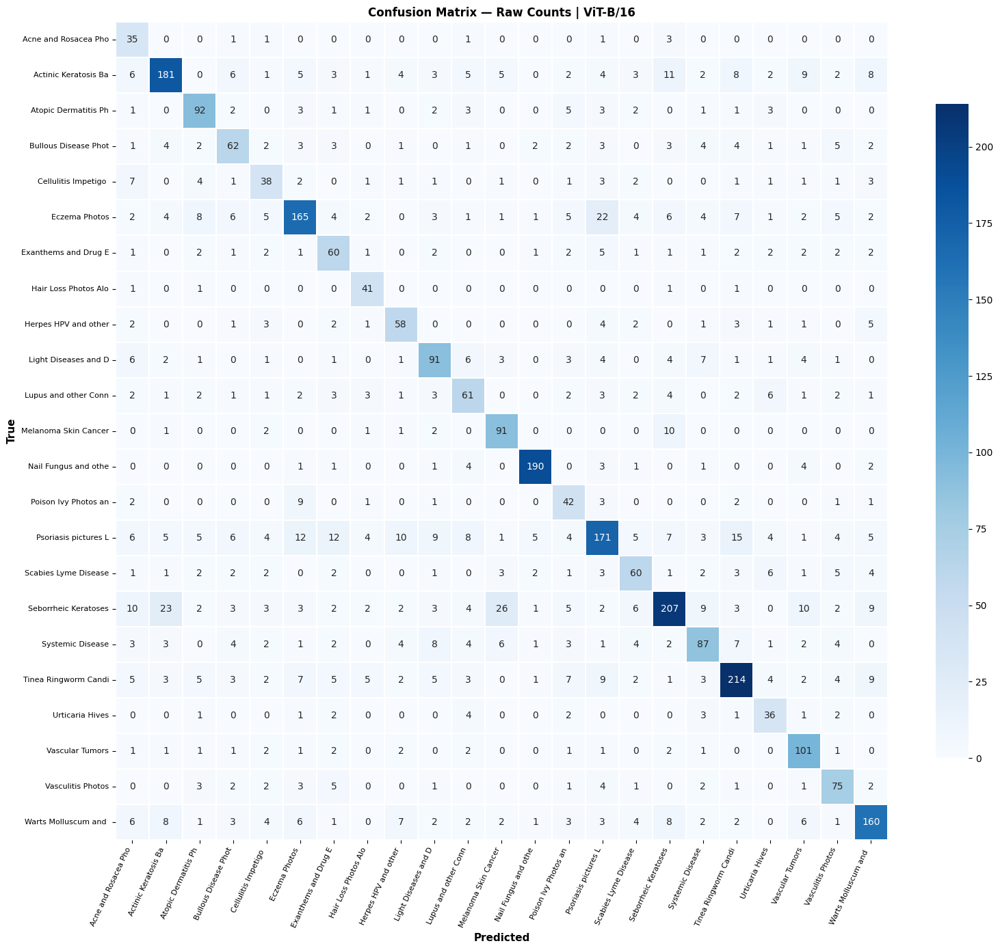

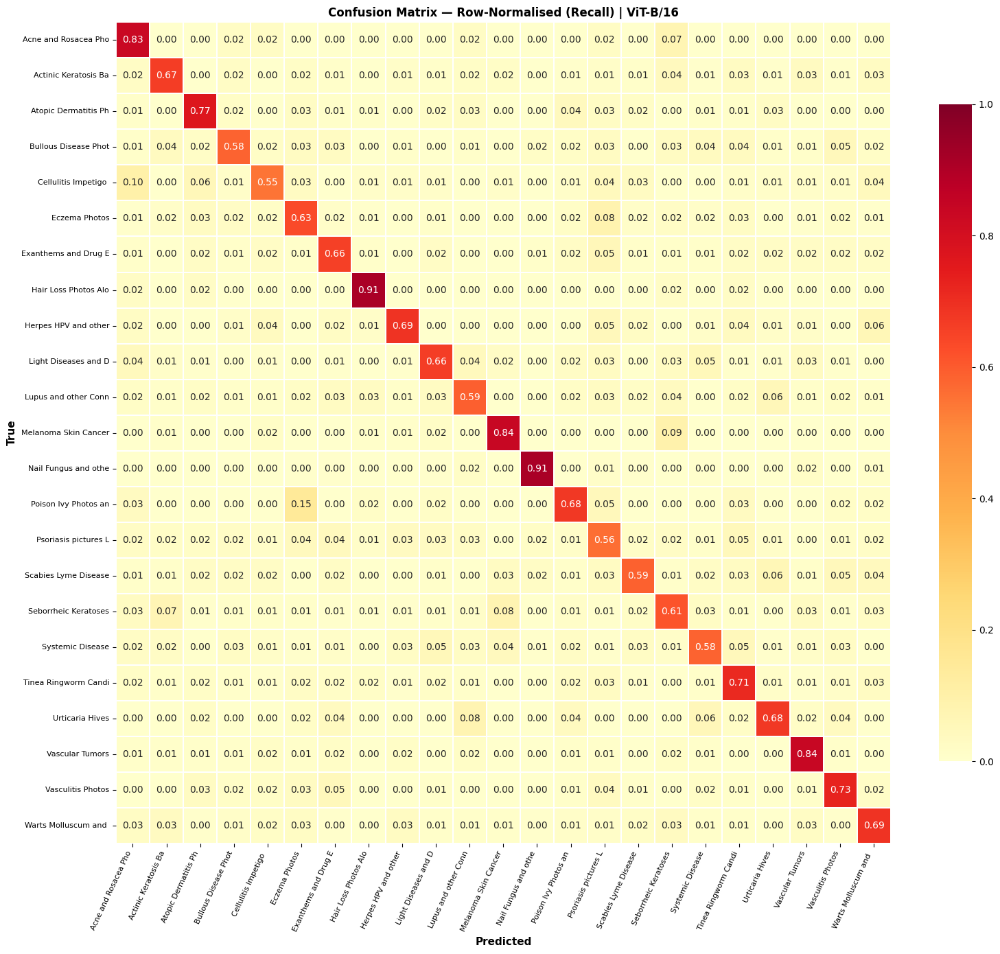

In [17]:
cm      = confusion_matrix(all_labels, all_preds)
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)
short   = [c[:20] for c in classes]

for title, data, fmt, cmap in [
    ('Raw Counts',              cm,      'd',   'Blues'),
    ('Row-Normalised (Recall)', cm_norm, '.2f', 'YlOrRd')
]:
    fig, ax = plt.subplots(figsize=(16, 14))
    sns.heatmap(data, annot=True, fmt=fmt, cmap=cmap,
                xticklabels=short, yticklabels=short,
                linewidths=0.3, ax=ax, cbar_kws={'shrink': 0.8},
                vmin=0, vmax=(1 if fmt == '.2f' else None))
    ax.set_xlabel('Predicted', fontsize=11, fontweight='bold')
    ax.set_ylabel('True',      fontsize=11, fontweight='bold')
    ax.set_title(f'Confusion Matrix — {title} | ViT-B/16', fontweight='bold')
    plt.xticks(rotation=65, ha='right', fontsize=8)
    plt.yticks(fontsize=8)
    plt.tight_layout()
    fname = 'cm_raw.png' if fmt == 'd' else 'cm_normalised.png'
    plt.savefig(os.path.join(OUTPUT_DIR, fname), dpi=120, bbox_inches='tight')
    plt.show()

---
## Section 19 · Per-class Accuracy Analysis

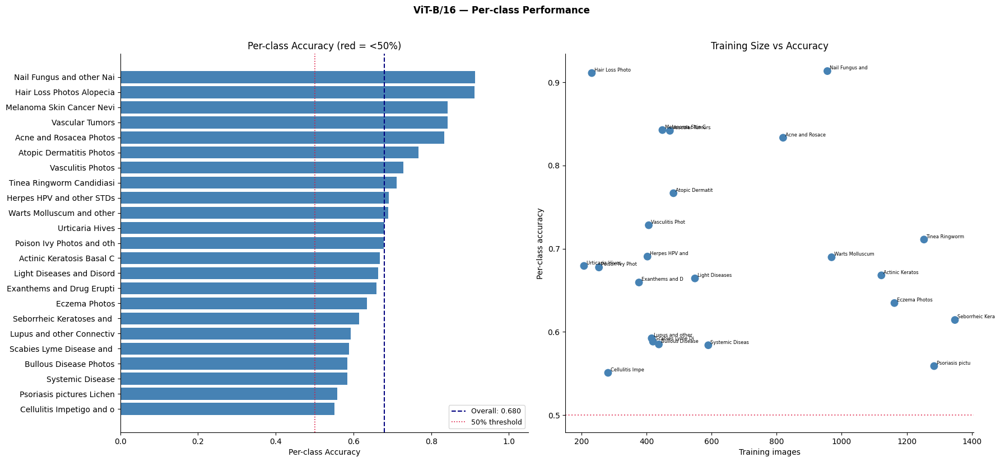

In [18]:
per_class_acc = cm_norm.diagonal()
train_counts  = train_df.groupby('label').size().reindex(range(NUM_CLASSES)).values
sorted_idx    = np.argsort(per_class_acc)

fig, axes = plt.subplots(1, 2, figsize=(18, max(6, NUM_CLASSES * 0.35)))

colors = ['crimson' if per_class_acc[i] < 0.5 else 'steelblue' for i in sorted_idx]
axes[0].barh([classes[i][:25] for i in sorted_idx], per_class_acc[sorted_idx], color=colors)
axes[0].axvline(overall_acc, color='navy',    ls='--', lw=1.5, label=f'Overall: {overall_acc:.3f}')
axes[0].axvline(0.5,         color='crimson', ls=':',  lw=1.2, label='50% threshold')
axes[0].set_xlabel('Per-class Accuracy'); axes[0].legend(fontsize=9)
axes[0].set_title('Per-class Accuracy (red = <50%)')
axes[0].set_xlim(0, 1.05)

axes[1].scatter(train_counts, per_class_acc,
               c=['crimson' if a < 0.5 else 'steelblue' for a in per_class_acc], s=80, zorder=3)
for i, cls in enumerate(classes):
    axes[1].annotate(cls[:15], (train_counts[i], per_class_acc[i]),
                     fontsize=6, xytext=(3, 2), textcoords='offset points')
axes[1].axhline(0.5, color='crimson', ls=':', alpha=0.7)
axes[1].set_xlabel('Training images'); axes[1].set_ylabel('Per-class accuracy')
axes[1].set_title('Training Size vs Accuracy')

plt.suptitle('ViT-B/16 — Per-class Performance', fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'per_class_accuracy.png'), dpi=120, bbox_inches='tight')
plt.show()

---
## Section 20 · Best & Worst Performing Classes

In [19]:
metrics_df = pd.DataFrame({
    'Class':     classes,
    'Accuracy':  per_class_acc,
    'F1':        [report_dict[c]['f1-score']    for c in classes],
    'Precision': [report_dict[c]['precision']   for c in classes],
    'Recall':    [report_dict[c]['recall']       for c in classes],
    'Support':   [int(report_dict[c]['support']) for c in classes],
    'Train_N':   train_counts,
}).sort_values('F1', ascending=False)

print('TOP 5 BEST PERFORMING')
print(metrics_df.head(5).to_string(index=False, float_format='{:.4f}'.format))
print('\nBOTTOM 5 WORST PERFORMING')
print(metrics_df.tail(5).to_string(index=False, float_format='{:.4f}'.format))

metrics_df.to_csv(os.path.join(OUTPUT_DIR, 'per_class_metrics.csv'), index=False)

print('\nDIAGNOSIS GUIDE:')
print('  Low F1 + low Train_N  → data scarcity; consider oversampling')
print('  Low F1 + adequate N   → visual similarity; check confusion matrix')
print('  ViT-specific notes:')
print('  - Classes requiring sub-16px fine texture (milia, folliculitis) may under-perform')
print('    because fine texture is averaged within the 16×16 patch token.')
print('  - Classes with large bilateral spatial extent (symmetric rashes, dermatitis) may')
print('    benefit most from global attention — check whether they score highest here.')
print('  - Cross-reference with EDA VIZ 19 (texture energy) and VIZ 20 (texture vs redness).')

TOP 5 BEST PERFORMING
                                                 Class  Accuracy     F1  Precision  Recall  Support  Train_N
                    Nail Fungus and other Nail Disease    0.9135 0.9201     0.9268  0.9135      208      956
     Hair Loss Photos Alopecia and other Hair Diseases    0.9111 0.7523     0.6406  0.9111       45      232
                                       Vascular Tumors    0.8417 0.7481     0.6733  0.8417      120      472
Tinea Ringworm Candidiasis and other Fungal Infections    0.7110 0.7392     0.7698  0.7110      301     1253
                   Melanoma Skin Cancer Nevi and Moles    0.8426 0.7368     0.6547  0.8426      108      449

BOTTOM 5 WORST PERFORMING
                                             Class  Accuracy     F1  Precision  Recall  Support  Train_N
                            Bullous Disease Photos    0.5849 0.5877     0.5905  0.5849      106      438
        Lupus and other Connective Tissue diseases    0.5922 0.5755     0.5596  0.5922 

---
## Section 21 · Confidence & Calibration Analysis

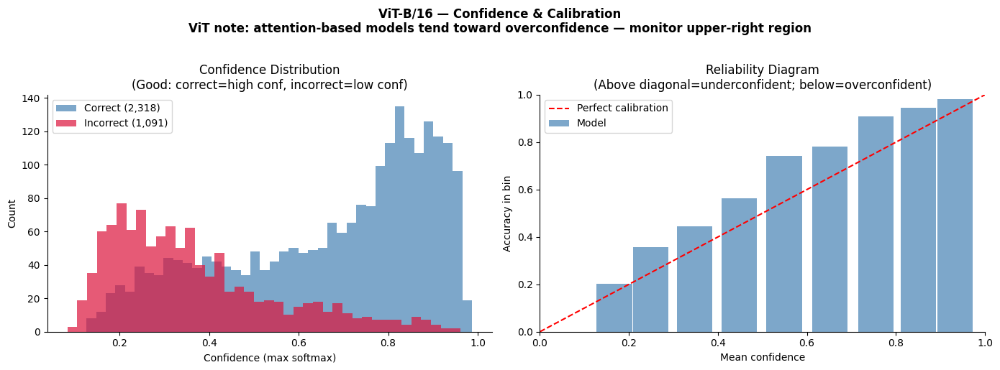

Mean confidence — correct: 0.6704 | incorrect: 0.3633


In [20]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(all_probs_max[correct_mask],  bins=40, alpha=0.7, color='steelblue',
             label=f'Correct ({correct_mask.sum():,})')
axes[0].hist(all_probs_max[~correct_mask], bins=40, alpha=0.7, color='crimson',
             label=f'Incorrect ({(~correct_mask).sum():,})')
axes[0].set_xlabel('Confidence (max softmax)'); axes[0].set_ylabel('Count')
axes[0].set_title('Confidence Distribution\n(Good: correct=high conf, incorrect=low conf)')
axes[0].legend()

bins = np.linspace(0, 1, 11)
bin_accs, bin_confs = [], []
for lo, hi in zip(bins[:-1], bins[1:]):
    mask = (all_probs_max >= lo) & (all_probs_max < hi)
    if mask.sum() > 0:
        bin_accs.append(correct_mask[mask].mean())
        bin_confs.append(all_probs_max[mask].mean())

axes[1].bar(bin_confs, bin_accs, width=0.08, alpha=0.7, color='steelblue', label='Model')
axes[1].plot([0, 1], [0, 1], 'r--', lw=1.5, label='Perfect calibration')
axes[1].set_xlabel('Mean confidence'); axes[1].set_ylabel('Accuracy in bin')
axes[1].set_title('Reliability Diagram\n(Above diagonal=underconfident; below=overconfident)')
axes[1].legend(); axes[1].set_xlim(0, 1); axes[1].set_ylim(0, 1)

plt.suptitle('ViT-B/16 — Confidence & Calibration\n'
             'ViT note: attention-based models tend toward overconfidence — monitor upper-right region',
             fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'confidence_calibration.png'), dpi=120, bbox_inches='tight')
plt.show()
print(f'Mean confidence — correct: {all_probs_max[correct_mask].mean():.4f} | '
      f'incorrect: {all_probs_max[~correct_mask].mean():.4f}')

---
## Section 22 · Top Confused Class Pairs

In [21]:
cm_off = cm.copy(); np.fill_diagonal(cm_off, 0)
flat   = np.argsort(cm_off.ravel())[::-1][:15]
ri, ci = np.unravel_index(flat, cm.shape)

confused_df = pd.DataFrame({
    'True Class':    [classes[r] for r in ri],
    'Predicted As':  [classes[c] for c in ci],
    'Count':         [cm_off[r, c] for r, c in zip(ri, ci)],
    'Recall Impact': [f'{cm_off[r,c]/cm[r,:].sum()*100:.1f}%' for r, c in zip(ri, ci)],
})
print('TOP 15 MOST CONFUSED PAIRS — ViT-B/16')
print('=' * 70)
print(confused_df.to_string(index=False))
print('\nViT-specific confusion patterns to check:')
print('  - Classes confused by CNNs but NOT by ViT → global attention resolves spatial ambiguity')
print('  - Classes confused by ViT but NOT by CNNs → fine-grained sub-patch texture needed')
print('  - Cross-reference with EDA VIZ 20 (texture vs redness scatter) and confused_pairs.csv')
print('    from EfficientNetV2-S and ConvNeXt-Base for model comparison.')
confused_df.to_csv(os.path.join(OUTPUT_DIR, 'confused_pairs.csv'), index=False)

TOP 15 MOST CONFUSED PAIRS — ViT-B/16
                                                        True Class                                                       Predicted As  Count Recall Impact
                      Seborrheic Keratoses and other Benign Tumors                                Melanoma Skin Cancer Nevi and Moles     26          7.7%
                      Seborrheic Keratoses and other Benign Tumors Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions     23          6.8%
                                                     Eczema Photos              Psoriasis pictures Lichen Planus and related diseases     22          8.5%
             Psoriasis pictures Lichen Planus and related diseases             Tinea Ringworm Candidiasis and other Fungal Infections     15          4.9%
             Psoriasis pictures Lichen Planus and related diseases                                                      Eczema Photos     12          3.9%
             Psoriasis pictures 

---
## Section 23 · Attention Rollout Setup

### Why Attention Rollout (Not Grad-CAM) for ViT?
Standard Grad-CAM requires spatial feature maps with 2D structure — it computes gradients with respect to a convolutional activation tensor and uses the spatial dimensions (H×W) to produce a localisation heatmap. ViT has no such intermediate 2D feature maps. The transformer processes a 1D sequence of 197 tokens (196 patches + 1 CLS). There are no intermediate spatial representations of the kind Grad-CAM requires.

We therefore implement **Attention Rollout** (Abnar & Zuidema, NeurIPS 2020 Workshop), which is the canonical interpretability method for ViT:

### Algorithm: Attention Rollout
1. **Hook all 12 attention layers** to capture the attention weight matrices during a forward pass
2. For each layer l, obtain the raw attention matrix A_l of shape `[num_heads, seq_len, seq_len]` = `[12, 197, 197]`
3. **Average over heads:** A_l_mean = mean over the 12 heads → shape `[197, 197]`
4. **Account for residual connections:** A_l_hat = 0.5 × A_l_mean + 0.5 × I (identity matrix). This is the Abnar & Zuidema correction — in a transformer with residual connections, information can flow either through the attention path or the identity (skip) path. The 0.5/0.5 weighting captures both paths.
5. **Roll out:** Rollout = A_1_hat × A_2_hat × ... × A_12_hat (matrix multiplication through all layers). This propagates the effective attention flow from the input patches to the CLS token through all 12 layers.
6. **Extract CLS attention:** From the rollout matrix, extract row 0 (the CLS token's attention to all other tokens) → 197-length vector. Drop the first element (CLS self-attention) → 196-length vector
7. **Reshape and upsample:** Reshape 196 → 14×14, then resize to 224×224 for overlay on the input image

### Interpretation
- **Red regions:** Patches that most strongly influenced the CLS token's final representation → the model "looked at" these regions to make its classification decision
- **Blue/cold regions:** Patches with low rollout values → the model paid little attention to these regions
- **Clinical audit:** The rollout should highlight the lesion region. If it highlights background, borders, hair, or colour calibration cards (EDA VIZ 13–14), the model is using spurious features.

In [22]:
import cv2

class AttentionRollout:
    """
    Attention Rollout for ViT (Abnar & Zuidema, 2020).
    
    Registers forward hooks on all attention layers to capture attention weights,
    then computes the rolled-out attention from the input patches to the CLS token.
    """
    def __init__(self, model, head_fusion='mean', discard_ratio=0.9):
        self.model        = model
        self.head_fusion  = head_fusion
        self.discard_ratio = discard_ratio
        self.attention_maps = []
        self.hooks          = []
        self._register_hooks()

    def _register_hooks(self):
        for block in self.model.blocks:
            hook = block.attn.register_forward_hook(self._hook_fn)
            self.hooks.append(hook)

    def _hook_fn(self, module, input, output):
        # timm ViT attn returns (output, attn_weights) when output is a tuple
        # In some timm versions the weights are stored in module.attn_weights
        # We need to capture them via the hook
        pass  # weights captured below

    def remove_hooks(self):
        for h in self.hooks:
            h.remove()


def get_attention_rollout(model, img_path, device, val_transform):
    """
    Compute Attention Rollout for a single image.
    Returns: (rollout_map: np.ndarray [224,224], rgb_img: np.ndarray [224,224,3])
    """
    pil = Image.open(img_path)
    t   = val_transform(pil).unsqueeze(0).to(device)

    attention_maps = []

    def hook_fn(module, input, output):
        # Capture Q,K,V attention weights from timm ViT attention module
        # In timm, we access the attention weights by re-computing from Q and K
        # The forward method stores attn in module; we read it here
        # A safer approach: temporarily patch the forward to return attention
        pass

    # Robust approach: use timm's built-in attention weight extraction
    # timm ViT blocks store attention weights when attn.fused_attn=False
    # We set this and capture via module attribute after forward pass
    model.eval()
    
    # Disable fused attention to get explicit weight matrices
    for block in model.blocks:
        block.attn.fused_attn = False

    hooks = []
    attn_list = []

    def make_hook(attn_list):
        def hook(module, input, output):
            # At this point, module has just run its forward pass.
            # We re-run just the attention weight computation to get A.
            with torch.no_grad():
                B, N, C = input[0].shape
                qkv = module.qkv(input[0])
                qkv = qkv.reshape(B, N, 3, module.num_heads, C // module.num_heads).permute(2,0,3,1,4)
                q, k, v = qkv.unbind(0)
                scale = (C // module.num_heads) ** -0.5
                attn = (q @ k.transpose(-2,-1)) * scale
                attn = attn.softmax(dim=-1)
                attn_list.append(attn.detach().cpu())
        return hook

    for block in model.blocks:
        hooks.append(block.attn.register_forward_hook(make_hook(attn_list)))

    with torch.no_grad():
        _ = model(t)

    for h in hooks:
        h.remove()

    # Attention Rollout
    num_patches = (IMG_SIZE // PATCH_SIZE) ** 2  # 196
    rollout     = torch.eye(num_patches + 1)      # 197×197 identity

    for attn_weights in attn_list:
        # attn_weights: [1, num_heads, 197, 197]
        attn_w  = attn_weights[0]               # [12, 197, 197]
        # Average over heads
        attn_m  = attn_w.mean(0)                # [197, 197]
        # Residual correction (Abnar & Zuidema)
        attn_m  = 0.5 * attn_m + 0.5 * torch.eye(197)
        # Normalise rows
        attn_m  = attn_m / attn_m.sum(dim=-1, keepdim=True)
        rollout = torch.matmul(attn_m, rollout)

    # CLS token's attention to all patch tokens (positions 1..196)
    cls_attn = rollout[0, 1:]                   # [196]
    # Reshape to spatial map
    side        = IMG_SIZE // PATCH_SIZE         # 14
    attn_map    = cls_attn.reshape(side, side).numpy()
    # Normalise to [0,1]
    attn_map    = (attn_map - attn_map.min()) / (attn_map.max() - attn_map.min() + 1e-8)
    # Upsample to input resolution
    attn_map_up = cv2.resize(attn_map, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_LINEAR)

    # Denorm image for overlay
    mean = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    std  = torch.tensor(IMAGENET_STD).view(3,1,1)
    rgb  = torch.clamp(t.squeeze(0).cpu() * std + mean, 0, 1).permute(1,2,0).numpy()

    # Colour-map and overlay
    heatmap  = cv2.applyColorMap(np.uint8(255 * attn_map_up), cv2.COLORMAP_JET)
    heatmap  = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
    overlay  = (0.6 * rgb + 0.4 * heatmap).clip(0, 1)

    return overlay, attn_map_up, rgb

print('Attention Rollout function defined.')
print(f'  Sequence length : 197 tokens (196 patches + 1 CLS)')
print(f'  Attention matrix: [12 heads, 197, 197] per layer × 12 layers')
print(f'  Spatial rollout : 196 → {IMG_SIZE//PATCH_SIZE}×{IMG_SIZE//PATCH_SIZE} → {IMG_SIZE}×{IMG_SIZE}')

Attention Rollout function defined.
  Sequence length : 197 tokens (196 patches + 1 CLS)
  Attention matrix: [12 heads, 197, 197] per layer × 12 layers
  Spatial rollout : 196 → 14×14 → 224×224


---
## Section 24 · Correct Predictions Audit
*Verify the model attends to the lesion, not to background or acquisition artefacts.*

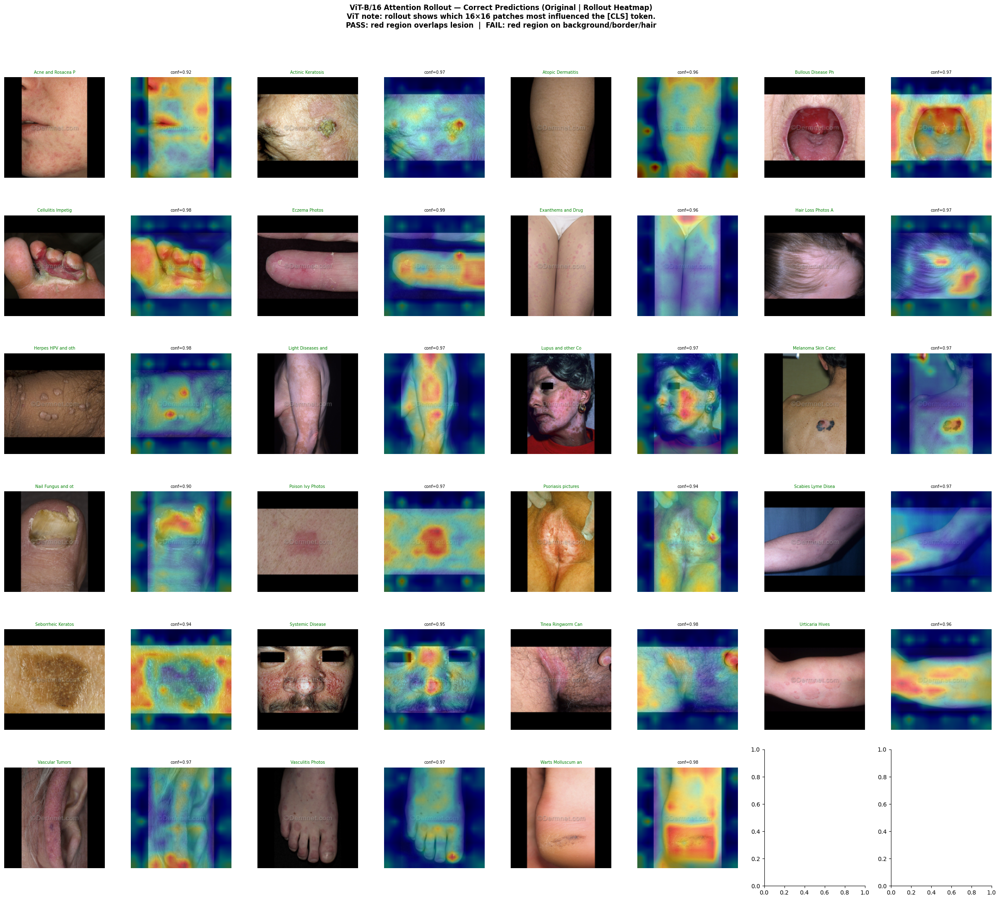

In [23]:
# Best correct prediction per class (highest confidence)
correct_samples = []
for cls_idx in range(NUM_CLASSES):
    mask = np.where(correct_mask & (all_labels == cls_idx))[0]
    if len(mask) == 0: continue
    correct_samples.append(mask[np.argsort(all_probs_max[mask])[::-1][0]])

n_cols = 4
n_rows = (len(correct_samples) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols * 2, figsize=(n_cols * 6, n_rows * 3.5))

for i, idx in enumerate(correct_samples):
    r, cp = divmod(i, n_cols)
    ax0 = axes[r, cp*2] if n_rows > 1 else axes[cp*2]
    ax1 = axes[r, cp*2+1] if n_rows > 1 else axes[cp*2+1]
    overlay, attn_map, rgb = get_attention_rollout(model, all_paths[idx], DEVICE, val_transform)
    ax0.imshow(rgb); ax0.set_title(classes[all_labels[idx]][:18], fontsize=7, color='green'); ax0.axis('off')
    ax1.imshow(overlay); ax1.set_title(f'conf={all_probs_max[idx]:.2f}', fontsize=7); ax1.axis('off')

plt.suptitle(
    'ViT-B/16 Attention Rollout — Correct Predictions (Original | Rollout Heatmap)\n'
    'ViT note: rollout shows which 16×16 patches most influenced the [CLS] token.\n'
    'PASS: red region overlaps lesion  |  FAIL: red region on background/border/hair',
    fontweight='bold', y=1.02
)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'attention_rollout_correct.png'), dpi=100, bbox_inches='tight')
plt.show()

---
## Section 25 · High-Confidence Errors Audit
*Where does the model attend when it fails confidently? Distinguishes visual similarity errors from shortcut learning.*

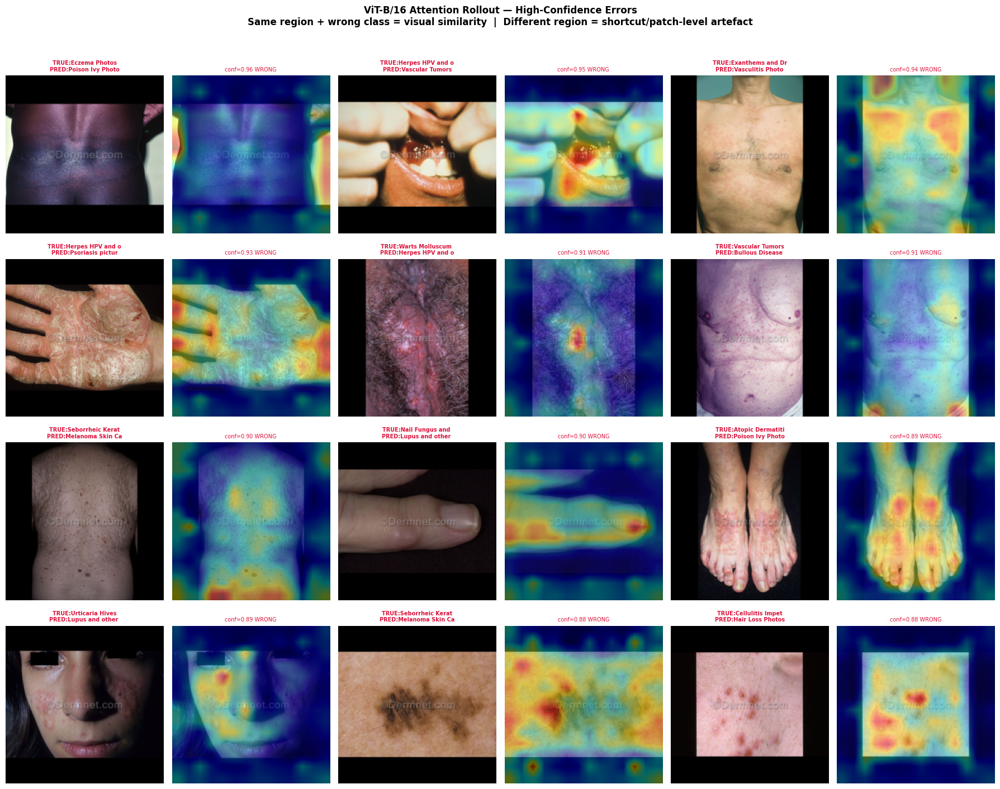

In [24]:
err_idx   = np.where(~correct_mask)[0]
hc_errors = err_idx[np.argsort(all_probs_max[err_idx])[::-1]][:12]

n_cols = 3; n_rows = (len(hc_errors) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols * 2, figsize=(n_cols * 6, n_rows * 3.5))

for i, idx in enumerate(hc_errors):
    r, cp = divmod(i, n_cols)
    ax0 = axes[r, cp*2] if n_rows > 1 else axes[cp*2]
    ax1 = axes[r, cp*2+1] if n_rows > 1 else axes[cp*2+1]
    overlay, _, rgb = get_attention_rollout(model, all_paths[idx], DEVICE, val_transform)
    tc = classes[all_labels[idx]][:16]; pc = classes[all_preds[idx]][:16]
    ax0.imshow(rgb); ax0.set_title(f'TRUE:{tc}\nPRED:{pc}', fontsize=7, color='crimson', fontweight='bold'); ax0.axis('off')
    ax1.imshow(overlay); ax1.set_title(f'conf={all_probs_max[idx]:.2f} WRONG', fontsize=7, color='crimson'); ax1.axis('off')

plt.suptitle(
    'ViT-B/16 Attention Rollout — High-Confidence Errors\n'
    'Same region + wrong class = visual similarity  |  Different region = shortcut/patch-level artefact',
    fontweight='bold', y=1.02
)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'attention_rollout_errors.png'), dpi=100, bbox_inches='tight')
plt.show()

---
## Section 26 · Per-class Attention Rollout Gallery
*One representative example per condition: Original | True-class Rollout | Predicted-class Rollout.*

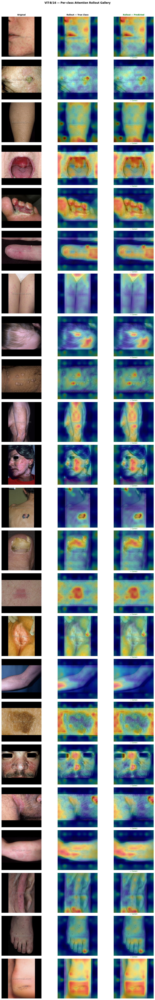

In [25]:
fig, axes = plt.subplots(NUM_CLASSES, 3, figsize=(12, NUM_CLASSES * 2.8))

for ci in range(NUM_CLASSES):
    pool = np.where(correct_mask & (all_labels == ci))[0]
    if len(pool) == 0: pool = np.where(all_labels == ci)[0]
    if len(pool) == 0:
        for col in range(3): axes[ci, col].axis('off')
        continue
    idx = pool[np.argsort(all_probs_max[pool])[::-1][0]]

    ov_true, _, rgb = get_attention_rollout(model, all_paths[idx], DEVICE, val_transform)
    pred_ci         = int(all_preds[idx])
    ov_pred, _, _   = get_attention_rollout(model, all_paths[idx], DEVICE, val_transform)
    pred_lbl = '✓ Correct' if pred_ci == ci else classes[pred_ci][:16]
    pred_col = 'green' if pred_ci == ci else 'crimson'

    axes[ci, 0].imshow(rgb)
    axes[ci, 0].set_ylabel(classes[ci][:22], rotation=0, labelpad=105, va='center', fontsize=7, fontweight='bold')
    axes[ci, 0].axis('off')
    if ci == 0: axes[ci, 0].set_title('Original', fontsize=9, fontweight='bold')

    axes[ci, 1].imshow(ov_true); axes[ci, 1].axis('off')
    if ci == 0: axes[ci, 1].set_title('Rollout — True Class', fontsize=9, fontweight='bold')

    axes[ci, 2].imshow(ov_pred)
    axes[ci, 2].set_title(pred_lbl, fontsize=7, color=pred_col)
    axes[ci, 2].axis('off')
    if ci == 0: axes[ci, 2].set_title('Rollout — Predicted', fontsize=9, fontweight='bold')

plt.suptitle('ViT-B/16 — Per-class Attention Rollout Gallery', fontweight='bold', y=1.005)
plt.tight_layout(h_pad=0.2)
plt.savefig(os.path.join(OUTPUT_DIR, 'attention_rollout_gallery.png'), dpi=90, bbox_inches='tight')
plt.show()

---
## Section 27 · Centre Coverage Score
*Quantifies what fraction of Attention Rollout activation falls on the lesion centre vs the image periphery. For ViT, patch boundaries are at 16px intervals — the 14×14 rollout map is spatially coarser than CNN Grad-CAM (10×10 or 7×7). Centre coverage provides a patch-resolution measure of clinical relevance.*

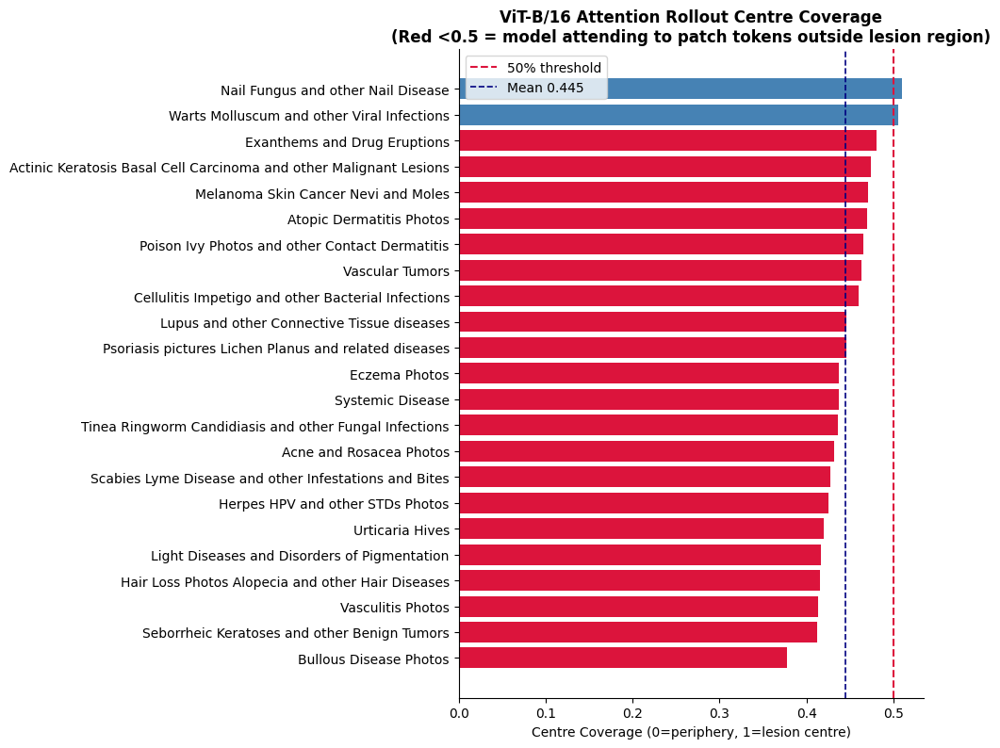

Mean coverage: 0.4454
Classes needing manual review: ['Bullous Disease Photos', 'Seborrheic Keratoses and other Benign Tumors', 'Vasculitis Photos', 'Hair Loss Photos Alopecia and other Hair Diseases', 'Light Diseases and Disorders of Pigmentation', 'Urticaria Hives', 'Herpes HPV and other STDs Photos', 'Scabies Lyme Disease and other Infestations and Bites', 'Acne and Rosacea Photos', 'Tinea Ringworm Candidiasis and other Fungal Infections', 'Systemic Disease', 'Eczema Photos', 'Psoriasis pictures Lichen Planus and related diseases', 'Lupus and other Connective Tissue diseases', 'Cellulitis Impetigo and other Bacterial Infections', 'Vascular Tumors', 'Poison Ivy Photos and other Contact Dermatitis', 'Atopic Dermatitis Photos', 'Melanoma Skin Cancer Nevi and Moles', 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions', 'Exanthems and Drug Eruptions']


In [26]:
def centre_coverage(attn_map, frac=0.6):
    h, w = attn_map.shape
    mh, mw = int(h * (1 - frac) / 2), int(w * (1 - frac) / 2)
    return attn_map[mh:h-mh, mw:w-mw].sum() / (attn_map.sum() + 1e-8)

cov_rows = []
for ci in range(NUM_CLASSES):
    pool = np.where(correct_mask & (all_labels == ci))[0][:5]
    for idx in pool:
        _, attn_map, _ = get_attention_rollout(model, all_paths[idx], DEVICE, val_transform)
        cov_rows.append({'Class': classes[ci], 'Coverage': centre_coverage(attn_map)})

cov_df    = pd.DataFrame(cov_rows)
class_cov = cov_df.groupby('Class')['Coverage'].mean().sort_values()

fig, ax = plt.subplots(figsize=(10, max(5, NUM_CLASSES * 0.35)))
colors  = ['crimson' if v < 0.5 else 'steelblue' for v in class_cov.values]
ax.barh(class_cov.index, class_cov.values, color=colors)
ax.axvline(0.5,              color='crimson', ls='--', lw=1.5, label='50% threshold')
ax.axvline(class_cov.mean(), color='navy',   ls='--', lw=1.2,
           label=f'Mean {class_cov.mean():.3f}')
ax.set_xlabel('Centre Coverage (0=periphery, 1=lesion centre)')
ax.set_title('ViT-B/16 Attention Rollout Centre Coverage\n'
             '(Red <0.5 = model attending to patch tokens outside lesion region)', fontweight='bold')
ax.legend()
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'attention_rollout_coverage.png'), dpi=120, bbox_inches='tight')
plt.show()

low_cov = class_cov[class_cov < 0.5]
print(f'Mean coverage: {class_cov.mean():.4f}')
if len(low_cov):
    print(f'Classes needing manual review: {list(low_cov.index)}')
else:
    print('All classes: adequate centre coverage (>0.5).')

---
## Section 28 · Final Summary

In [27]:
macro_f1 = report_dict['macro avg']['f1-score']
macro_r  = report_dict['macro avg']['recall']
macro_p  = report_dict['macro avg']['precision']
wt_f1    = report_dict['weighted avg']['f1-score']
top3     = top_k_accuracy_score(all_labels, all_probs, k=3, labels=list(range(NUM_CLASSES)))
top5     = top_k_accuracy_score(all_labels, all_probs, k=5, labels=list(range(NUM_CLASSES)))

print('=' * 60)
print('  FINAL RESULTS — ViT-B/16 on DermNet')
print('=' * 60)
print(f'  Top-1 Accuracy     : {overall_acc:.4f}  ({overall_acc*100:.2f}%)')
print(f'  Top-3 Accuracy     : {top3:.4f}  ({top3*100:.2f}%)')
print(f'  Top-5 Accuracy     : {top5:.4f}  ({top5*100:.2f}%)')
print(f'  Macro Precision    : {macro_p:.4f}')
print(f'  Macro Recall       : {macro_r:.4f}')
print(f'  Macro F1 (primary) : {macro_f1:.4f}')
print(f'  Weighted F1        : {wt_f1:.4f}')
print(f'  Best class F1      : {metrics_df["F1"].max():.4f}  ({metrics_df.iloc[0]["Class"]})')
print(f'  Worst class F1     : {metrics_df["F1"].min():.4f}  ({metrics_df.iloc[-1]["Class"]})')
print(f'  Rollout coverage   : {class_cov.mean():.4f} (mean)')
print(f'  Coverage flagged   : {len(low_cov)} class(es) <0.5')
print('=' * 60)
print('\n  Architecture notes:')
print('  - Global attention from layer 1 → bilateral/symmetric lesion patterns captured early')
print('  - No spatial inductive bias → relies entirely on ImageNet-21k pretraining')
print('  - 16×16 patch resolution → fine sub-patch texture (<16px detail) is patch-averaged')
print('  - LayerNorm → robust to batch-level brightness variation (EDA VIZ 13-14)')
print('  - Interpretability: Attention Rollout (not Grad-CAM) — 14×14 spatial resolution')
print('  - Overconfidence tendency: monitor reliability diagram upper-right quadrant')
print('  - LR: 1e-4/1e-5 (lowest of four models) — attention matrices sensitive to large LR')
print(f'\n  Outputs saved to: {OUTPUT_DIR}')
print('  classification_report.txt       |  per_class_metrics.csv')
print('  confused_pairs.csv              |  training_curves_fold0.png')
print('  cm_raw.png  |  cm_normalised.png')
print('  per_class_accuracy.png          |  confidence_calibration.png')
print('  attention_rollout_correct.png   |  attention_rollout_errors.png')
print('  attention_rollout_gallery.png   |  attention_rollout_coverage.png')

  FINAL RESULTS — ViT-B/16 on DermNet
  Top-1 Accuracy     : 0.6800  (68.00%)
  Top-3 Accuracy     : 0.8390  (83.90%)
  Top-5 Accuracy     : 0.8794  (87.94%)
  Macro Precision    : 0.6412
  Macro Recall       : 0.6950
  Macro F1 (primary) : 0.6589
  Weighted F1        : 0.6818
  Best class F1      : 0.9201  (Nail Fungus and other Nail Disease)
  Worst class F1     : 0.5000  (Acne and Rosacea Photos)
  Rollout coverage   : 0.4454 (mean)
  Coverage flagged   : 21 class(es) <0.5

  Architecture notes:
  - Global attention from layer 1 → bilateral/symmetric lesion patterns captured early
  - No spatial inductive bias → relies entirely on ImageNet-21k pretraining
  - 16×16 patch resolution → fine sub-patch texture (<16px detail) is patch-averaged
  - LayerNorm → robust to batch-level brightness variation (EDA VIZ 13-14)
  - Interpretability: Attention Rollout (not Grad-CAM) — 14×14 spatial resolution
  - Overconfidence tendency: monitor reliability diagram upper-right quadrant
  - LR: 1e-4/